<a href="https://colab.research.google.com/github/IvanovMaxim2000/ML_3_sem/blob/main/ML_3d_task_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Лабораторная работа №3
Задания:
1. Повторить эксперимент применения дифференциального рендеринга для восстановления параметров 3D сцены по исходному изображению человеческого лица (Моны Лизы);

2. Повторить тот же эксперимент, но для стороннего изображения человеческого лица.

## Установка и импорт необходимых библиотек

In [ ]:
!pip install torch

In [ ]:
!pip install redner

In [ ]:
!pip install matplotlib

In [ ]:
!pip install h5py

In [ ]:
!pip install "redner-0.4.25-cp38-cp38-win_amd64.whl"

In [ ]:
import h5py
import urllib
import time
import torch
import math
import numpy as np
import pyredner

from matplotlib.pyplot import imshow
%matplotlib inline

import matplotlib.pyplot as plt
from IPython.display import display, clear_output
from matplotlib import animation

from IPython.display import HTML

In [ ]:
use_gpu = torch.cuda.is_available()
device = torch.device('cuda') if use_gpu else torch.device('cpu')

def get_device():
    """
        Get the torch device we are using.
    """
    global device
    return device

## Загрузка модели усредненного лица

In [ ]:
with h5py.File(r'C:\Users\Sover\Desktop\July\model2017-1_bfm_nomouth.h5', 'r') as hf:
    shape_mean = torch.tensor(hf['shape/model/mean'],
                              device = get_device())
    shape_basis = torch.tensor(hf['shape/model/pcaBasis'],
                               device = get_device())
    triangle_list = torch.tensor(hf['shape/representer/cells'],
                                 device = get_device())
    color_mean = torch.tensor(hf['color/model/mean'],
                              device = get_device())
    color_basis = torch.tensor(hf['color/model/pcaBasis'],
                               device = get_device())

C:\Users\Sover\AppData\Local\Temp\ipykernel_10736\4162682716.py:5: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:264.)
  shape_basis = torch.tensor(hf['shape/model/pcaBasis'],


## Создание модели
Данная модель на вход принимает векторы скрытого представления цвета и формы лица, параметры камеры и освещения в сцене, а на выходе генерирует отрендеренное изображение.

In [ ]:
indices = triangle_list.permute(1, 0).contiguous()

def model(
        cam_pos,
        cam_look_at,
        shape_coeffs,
        color_coeffs,
        ambient_color,
        dir_light_intensity):
    vertices = (shape_mean + shape_basis @ shape_coeffs).view(-1, 3)
    normals = pyredner.compute_vertex_normal(vertices, indices)
    colors = (color_mean + color_basis @ color_coeffs).view(-1, 3)
    m = pyredner.Material(use_vertex_color = True)
    obj = pyredner.Object(vertices = vertices,
                          indices = indices,
                          normals = normals,
                          material = m,
                          colors = colors)
    cam = pyredner.Camera(position = cam_pos,
                          # Center of the vertices
                          look_at = cam_look_at,
                          up = torch.tensor([0.0, 1.0, 0.0]),
                          fov = torch.tensor([45.0]),
                          resolution = (256, 256))
    scene = pyredner.Scene(camera = cam, objects = [obj])
    ambient_light = pyredner.AmbientLight(ambient_color)
    dir_light = pyredner.DirectionalLight(torch.tensor([0.0, 0.0, -1.0]),
                                          dir_light_intensity)
    img = pyredner.render_deferred(scene = scene,
                                   lights = [ambient_light, dir_light])
    return img

## Изображение усредненного лица
Для просмотра усредненного лица необходимо задать первоначальные параметры освещения и позиции камеры в качестве параметров для модели.

Scene construction, time: 0.02802 s
Forward pass, time: 0.08906 s


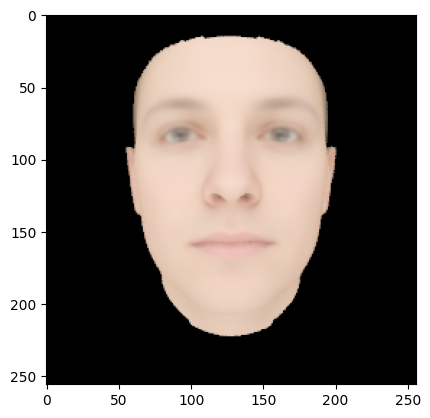

In [ ]:
cam_pos = torch.tensor([-0.2697, -5.7891, 373.9277])
cam_look_at = torch.tensor([-0.2697, -5.7891, 54.7918])
img = model(cam_pos,
            cam_look_at,
            torch.zeros(199, device = get_device()),
            torch.zeros(199, device = get_device()),
            torch.ones(3),
            torch.zeros(3))

imshow(torch.pow(img, 1.0/2.2).cpu())

## Эксперимент с изображением Моны Лизы

### Целевое изображение
Загрузка целевого изображения, параметры которого требуется восстановить.

Scene construction, time: 0.02302 s
Forward pass, time: 0.09706 s


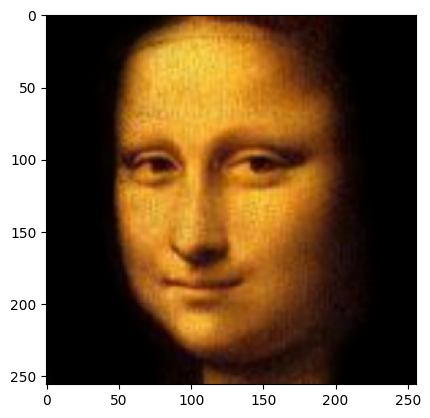

In [ ]:
face_url = 'https://raw.githubusercontent.com/BachiLi/redner/master/tutorials/mona-lisa-cropped-256.png'

urllib.request.urlretrieve(face_url, 'target.png')
target = pyredner.imread('target.png').to(pyredner.get_device())

imshow(torch.pow(target, 1.0/2.2).cpu())

### Начальные значения параметров
Задание начальных параметров, которые необходимо восстановить для целевой картины.

In [ ]:
# Set requires_grad=True since we want to optimize them later
cam_pos = torch.tensor([-0.2697, -5.7891, 373.9277],
                       requires_grad=True)
cam_look_at = torch.tensor([-0.2697, -5.7891, 54.7918],
                           requires_grad=True)
shape_coeffs = torch.zeros(199, device = pyredner.get_device(),
                           requires_grad=True)
color_coeffs = torch.zeros(199, device = pyredner.get_device(),
                           requires_grad=True)
ambient_color = torch.ones(3, device = pyredner.get_device(),
                           requires_grad=True)
dir_light_intensity = torch.zeros(3, device = pyredner.get_device(),
                                  requires_grad=True)

# Use two different optimizers for different learning rates
optimizer = torch.optim.Adam(
                             [
                              shape_coeffs,
                              color_coeffs,
                              ambient_color,
                              dir_light_intensity],
                             lr=0.1)
cam_optimizer = torch.optim.Adam([cam_pos, cam_look_at], lr=0.5)

### Выполнение
На данном этапе происходит организация оптимизационного цикла и логирование происходящего с функцией ошибки (в данном случае это попиксельный MSE и квадратичные регуляризаторы параметров) и с самой 3D моделью.


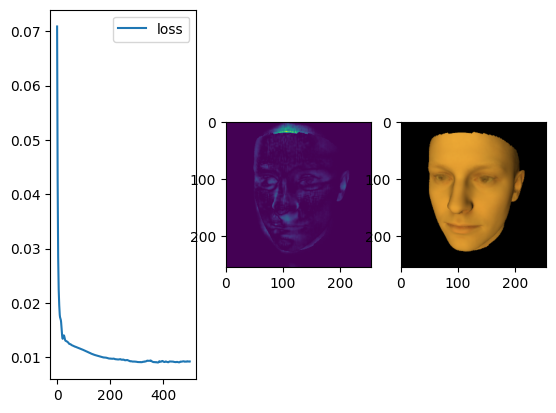

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure()
imgs, losses = [], []

# Run 500 Adam iterations
num_iters = 500
for t in range(num_iters):
    optimizer.zero_grad()
    cam_optimizer.zero_grad()
    img = model(cam_pos, cam_look_at, shape_coeffs,
                 color_coeffs, ambient_color, dir_light_intensity)
    # Compute the loss function. Here it is L2 plus a regularization
    # term to avoid coefficients to be too far from zero.
    # Both img and target are in linear color space,
    # so no gamma correction is needed.

    loss = (img - target).pow(2).mean()
    loss = loss + 0.0001 * shape_coeffs.pow(2).mean() + 0.001 * color_coeffs.pow(2).mean()
    loss.backward()

    optimizer.step()
    cam_optimizer.step()

    ambient_color.data.clamp_(0.0)
    dir_light_intensity.data.clamp_(0.0)

    # Plot the loss
    f, (ax_loss, ax_diff_img, ax_img) = plt.subplots(1, 3)
    losses.append(loss.data.item())

    # Only store images every 10th iterations
    if t % 10 == 0:
        # Record the Gamma corrected image
        imgs.append(torch.pow(img.data, 1.0/2.2).cpu())
    clear_output(wait=True)
    ax_loss.plot(range(len(losses)), losses, label='loss')
    ax_loss.legend()
    ax_diff_img.imshow((img -target).pow(2).sum(dim=2).data.cpu())
    ax_img.imshow(torch.pow(img.data.cpu(), 1.0/2.2))

plt.show()


### Анимация
Для более лучшего понимания происходящего со сценой в процессе обучения, представлена анимация из полученных логов.

In [ ]:
%matplotlib inline

fig = plt.figure()

# Clamp to avoid complains
im = plt.imshow(imgs[0].clamp(0.0, 1.0), animated=True)

def update_fig(i):
    im.set_array(imgs[i].clamp(0.0, 1.0))
    return im,
anim = animation.FuncAnimation(fig, update_fig,
                               frames=len(imgs), interval=50, blit=True)

HTML(anim.to_jshtml())

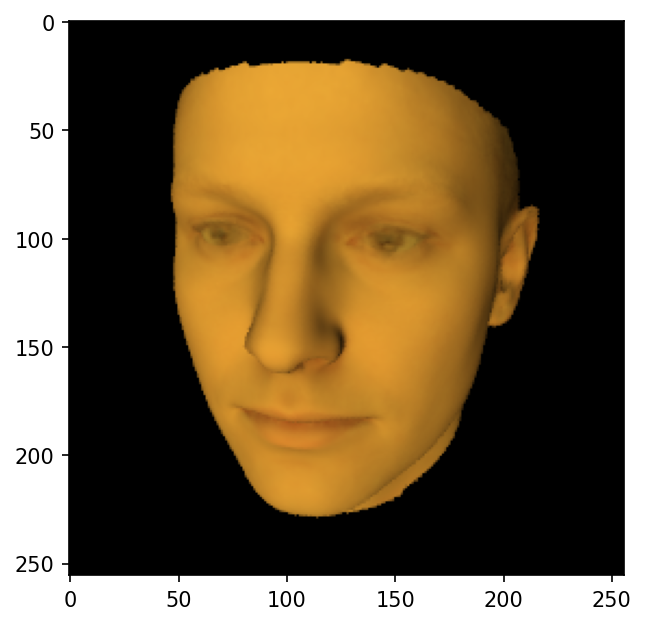

In [ ]:
plt.imshow(imgs[-1].clamp(0.0, 1.0), animated=True)

## Выполнение эксперимента со сторонним изображением

### Целевое изображение
Загрузка целевого изображения, параметры которого требуется восстановить.

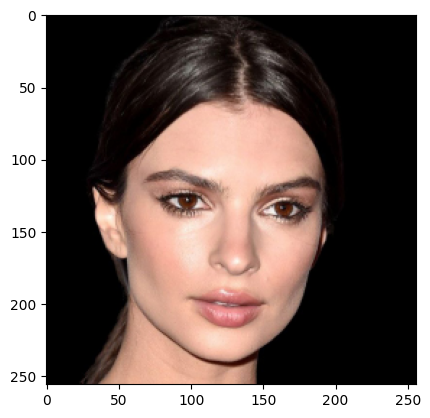

In [ ]:
face_url = r'photo_2023-12-19_21-02-30.jpg'

target = pyredner.imread(face_url).to(pyredner.get_device())

imshow(torch.pow(target, 1.0/2.2).cpu())

### Начальные значения параметров
Задание начальных параметров, которые необходимо восстановить для целевой картины.

In [ ]:
# Set requires_grad=True since we want to optimize them later
cam_pos = torch.tensor([-0.2697, -5.7891, 373.9277],
                       requires_grad=True)
cam_look_at = torch.tensor([-0.2697, -5.7891, 54.7918],
                           requires_grad=True)
shape_coeffs = torch.zeros(199, device = pyredner.get_device(),
                           requires_grad=True)
color_coeffs = torch.zeros(199, device = pyredner.get_device(),
                           requires_grad=True)
ambient_color = torch.ones(3, device = pyredner.get_device(),
                           requires_grad=True)
dir_light_intensity = torch.zeros(3, device = pyredner.get_device(),
                                  requires_grad=True)

# Use two different optimizers for different learning rates
optimizer = torch.optim.Adam(
                             [
                              shape_coeffs,
                              color_coeffs,
                              ambient_color,
                              dir_light_intensity],
                             lr=0.1)
cam_optimizer = torch.optim.Adam([cam_pos, cam_look_at], lr=0.5)

### Выполнение
На данном этапе происходит организация оптимизационного цикла и логирование происходящего с функцией ошибки (в данном случае это попиксельный MSE и квадратичные регуляризаторы параметров) и с самой 3D моделью.

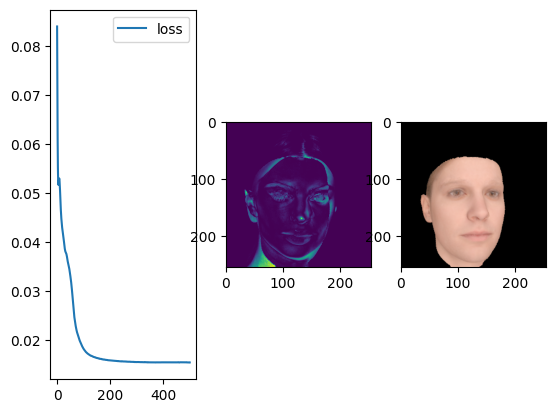

In [ ]:
plt.figure()
imgs, losses = [], []

# Run 500 Adam iterations
num_iters = 500
for t in range(num_iters):
    optimizer.zero_grad()
    cam_optimizer.zero_grad()
    img = model(cam_pos, cam_look_at, shape_coeffs,
                 color_coeffs, ambient_color, dir_light_intensity)
    # Compute the loss function. Here it is L2 plus a regularization
    # term to avoid coefficients to be too far from zero.
    # Both img and target are in linear color space,
    # so no gamma correction is needed.

    loss = (img - target).pow(2).mean()
    loss = loss + 0.0001 * shape_coeffs.pow(2).mean() + 0.001 * color_coeffs.pow(2).mean()
    loss.backward()

    optimizer.step()
    cam_optimizer.step()

    ambient_color.data.clamp_(0.0)
    dir_light_intensity.data.clamp_(0.0)

    # Plot the loss
    f, (ax_loss, ax_diff_img, ax_img) = plt.subplots(1, 3)
    losses.append(loss.data.item())

    # Only store images every 10th iterations
    if t % 10 == 0:
        # Record the Gamma corrected image
        imgs.append(torch.pow(img.data, 1.0/2.2).cpu())
    clear_output(wait=True)
    ax_loss.plot(range(len(losses)), losses, label='loss')
    ax_loss.legend()
    ax_diff_img.imshow((img-target).pow(2).sum(dim=2).data.cpu())
    ax_img.imshow(torch.pow(img.data.cpu(), 1.0/2.2))
    plt.show()

### Анимация
Для более лучшего понимания происходящего со сценой в процессе обучения, представлена анимация из полученных логов.

In [ ]:
%matplotlib inline

fig = plt.figure()

# Clamp to avoid complains
im = plt.imshow(imgs[0].clamp(0.0, 1.0), animated=True)

def update_fig(i):
    im.set_array(imgs[i].clamp(0.0, 1.0))
    return im,
anim = animation.FuncAnimation(fig, update_fig,
                               frames=len(imgs), interval=50, blit=True)

HTML(anim.to_jshtml())

c:\users\sover\desktop\july\pythonapplication1\env\lib\site-packages\matplotlib\cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


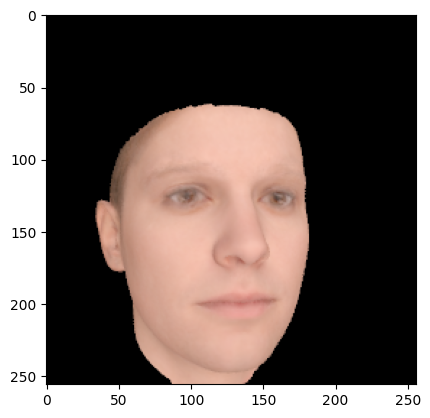

In [ ]:
plt.imshow(imgs[-1].clamp(0.0, 1.0), animated=True)